# Graded Challenge 2
---

## Introduction

Name  : Izzatur Arrasya 002<br>

## Dataset Introduction
<b>Rain in Australia</b> <br>

<b>Context</b> <br>
Predict next-day rain by training classification models on the target variable RainTomorrow.

<b>Content</b> <br>
This dataset contains about 10 years of daily weather observations from many locations across Australia.

RainTomorrow is the target variable to predict. It means -- did it rain the next day, Yes or No? This column is Yes if the rain for that day was 1mm or more.

## Objective

In this notebook of Graded Challenge 1 was created to evaluate the Regression concept as follows:

1. Able to understand the concept of classification with Logistic Regression and SVM
2. Able to prepare data for use in Logistic Regression and SVM models
3. Able to implement Logistic Regression and SVM to make predictions

and I will try to predict next-day rain in Australia based on the features or variables available in this dataset

## Import Library
---

In [2]:
import time
import numpy as np 
import pandas as pd
from scipy import stats  
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn import metrics
from sklearn import svm
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
%matplotlib inline

## Data Loading
---

In [1]:
#load data using pandas
df = pd.read_csv("weatherAUS.csv")
df.head()

NameError: name 'pd' is not defined

In [ ]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

From the data above, we get some of information of every column in data frame :

1. Column 'Date' : Date of the observation
2. Column 'Location' : Location of the weather station
3. Column 'MinTemp' : Minimum temperature in the 24 hours to 9am. 
4. Column 'MaxTemp' : Maximum temperature in the 24 hours to 9am. 
5. Column 'Rainfall': Precipitation in the 24 hours to 9am. 
6. Column 'Evaporation' : "Class A" pan evaporation in the 24 hours to 9am
7. Column 'Sunshine' : Bright sunshine in the 24 hours to midnight
8. Column 'WindGustDir' : Direction of the strongest wind gust in the 24 hours to midnight
9. Column 'WindGustSpeed' :Speed of the strongest wind gust in the 24 hours to midnight
10. Column 'WindDir9am' : Direction of the wind at 9am
11. Column 'WindDir3pm' : Direction of the wind at 3pm
12. Column 'WindSpeed9am' : Speed of the wind at 9am
13. Column 'WindSpeed3pm' : Speed of the wind at 3pm
14. Column 'Humidity9am' : Relative humidity at 9am
15. Column 'Humidity3pm' : Relative humidity at 3pm
16. Column 'Pressure9am' : Atmospheric pressure reduced to mean sea level at 9am
17. Column 'Pressure3pm' : Atmospheric pressure reduced to mean sea level at 3pm
18. Column 'Cloud9am' : Fraction of sky obscured by cloud at 9am
19. Column 'Cloud3pm' : Fraction of sky obscured by cloud at 3pm
20. Column 'Temp9am' : Temparature at 9am
21. Column 'Temp3pm' : Temparature at 3am
22. Column 'RainToday' : Did the current day receive precipitation exceeding 1mm in the 24 hours to 9am
23. Column 'RainTomorrow' : Did the next day receive precipitation exceeding 1mm in the 24 hours to 9am

In [ ]:
df.shape

(145460, 23)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


## Data Cleaning
---

copy the dataframe so we have the original version of dataset as a backup if the work got messy

In [ ]:
#copy dataframe
df_rain = df.copy()

In [ ]:
#Numeric columns
df_numeric = df.select_dtypes(exclude="object")
print(df_numeric.columns)
print("")


#Categorical columns
df_categoric = df.select_dtypes(include="object")
print(df_categoric.columns)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')


Then, we check if there is any missing value in dataset.

In [ ]:
#show null data
print(df_rain.isna().sum())

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64


In [ ]:
df_rain = df_rain.drop(columns=['Sunshine','Evaporation','Cloud3pm','Cloud9am','Date'],axis=1)
df_rain.shape

(145460, 18)

In [ ]:
df_rain = df_rain.dropna(how='any')
df_rain.shape

(112925, 18)

In [ ]:
#recheck any missing value
df_rain.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [ ]:
#checking any duplicate row
df_rain.duplicated().sum()

0

## Data Exploration Analysis
---

In [ ]:
df_rain.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

In [ ]:
px.histogram(df_rain, x='Location', 
             title='Location vs. Rainy Days', 
             color='RainToday')

From the data above:

1. Nhil, Darwin, Uluru reports least rain
3. Whatsonia receives most rain among 49 locations.
4. Location is might be a factor in deciding whether it will rain tomorrow or not.

In [ ]:
px.histogram(df_rain, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

If it didn't rain today, there is a pretty good chance that it will not rain tomorrow. (predicting not rain is easier, than predicting rain for tomorrow)

In [ ]:
px.histogram(df_rain.sample(100), 
             x='Rainfall', 
             title='Rainfall vs. Rain Tomorrow', 
             color='RainTomorrow')

<AxesSubplot:>

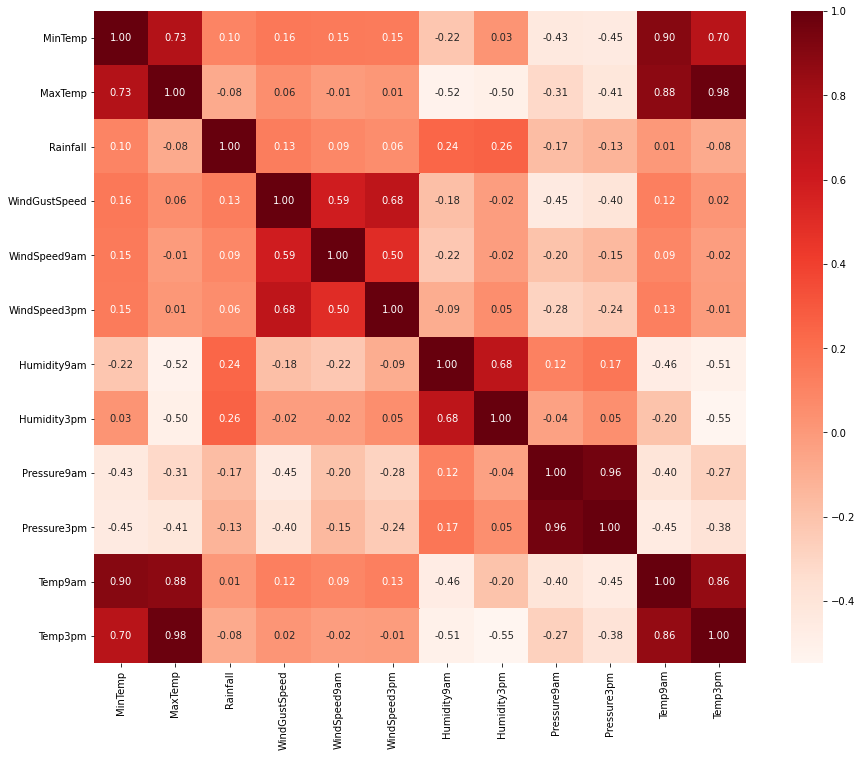

In [ ]:
plt.figure(figsize=(16,12))
sns.heatmap(df_rain.corr(),
            square=True, 
            cmap='Reds', 
            annot=True, 
            fmt='.2f', 
            linecolor='white');


Many positive correlation can be found between variables.

In [ ]:
#drop Location
df_rain = df_rain.drop(columns=['Location'],axis=1)
df_rain.shape

(112925, 17)

## Data Preprocessing
---

In [ ]:
#remove the outliers in our data using Z-score to detect and remove the outliers.

z = np.abs(stats.zscore(df_rain._get_numeric_data()))
print(z)
df_rain= df_rain[(z < 3).all(axis=1)]
print(df_rain.shape)

         MinTemp   MaxTemp  Rainfall  WindGustSpeed  WindSpeed9am  \
0       0.117567  0.108221  0.206661       0.241214      0.577742   
1       0.841802  0.206845  0.276405       0.241214      1.339742   
2       0.037620  0.292772  0.276405       0.391345      0.457900   
3       0.553991  0.622159  0.276405       1.260094      0.500842   
4       0.773137  1.237969  0.160165       0.016018      0.980214   
...          ...       ...       ...            ...           ...   
145454  1.465392  0.265754  0.276405       0.734636      0.021471   
145455  1.577319  0.036615  0.276405       0.734636      0.261157   
145456  1.449403  0.235487  0.276405       1.410225      0.261157   
145457  1.161592  0.464626  0.276405       0.284243      0.740528   
145458  0.777844  0.478947  0.276405       0.959832      0.261157   

        WindSpeed3pm  Humidity9am  Humidity3pm  Pressure9am  Pressure3pm  \
0           0.524408     0.190140     1.380413     1.382962     1.142455   
1           0.29131

In [ ]:
#process the categorical cloumns now
#change yes/no to 1/0 for RainToday and RainTomorrow
df_rain['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
df_rain['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)

#See unique values and convert them to int using pd.getDummies()
categorical_columns = ['WindGustDir', 'WindDir3pm', 'WindDir9am']
for col in categorical_columns:
    print(np.unique(df_rain[col]))
# transform the categorical columns
df_rain = pd.get_dummies(df_rain, columns=categorical_columns)
df_rain.iloc[4:9]

['E' 'ENE' 'ESE' 'N' 'NE' 'NNE' 'NNW' 'NW' 'S' 'SE' 'SSE' 'SSW' 'SW' 'W'
 'WNW' 'WSW']
['E' 'ENE' 'ESE' 'N' 'NE' 'NNE' 'NNW' 'NW' 'S' 'SE' 'SSE' 'SSW' 'SW' 'W'
 'WNW' 'WSW']
['E' 'ENE' 'ESE' 'N' 'NE' 'NNE' 'NNW' 'NW' 'S' 'SE' 'SSE' 'SSW' 'SW' 'W'
 'WNW' 'WSW']


,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0,0,0,0,0,0,0,0,0,0
5,14.6,29.7,0.2,56.0,19.0,24.0,55.0,23.0,1009.2,1005.4,...,0,0,0,0,0,0,0,1,0,0
6,14.3,25.0,0.0,50.0,20.0,24.0,49.0,19.0,1009.6,1008.2,...,0,0,0,0,0,0,1,0,0,0
7,7.7,26.7,0.0,35.0,6.0,17.0,48.0,19.0,1013.4,1010.1,...,0,0,0,0,1,0,0,0,0,0
8,9.7,31.9,0.0,80.0,7.0,28.0,42.0,9.0,1008.9,1003.6,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
#standardize our data - using MinMaxScaler
scaler = preprocessing.MinMaxScaler()
scaler.fit(df_rain)
df_rain = pd.DataFrame(scaler.transform(df_rain), index=df_rain.index, columns=df_rain.columns)
df_rain.iloc[4:10]

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW
4,0.628342,0.696296,0.035714,0.465753,0.135135,0.428571,0.797753,0.33,0.342043,0.282974,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.550802,0.632099,0.007143,0.671233,0.459459,0.523810,0.494382,0.23,0.304038,0.268585,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6,0.542781,0.516049,0.000000,0.589041,0.486486,0.523810,0.426966,0.19,0.313539,0.335731,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,0.366310,0.558025,0.000000,0.383562,0.108108,0.357143,0.415730,0.19,0.403800,0.381295,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
8,0.419786,0.686420,0.000000,1.000000,0.135135,0.619048,0.348315,0.09,0.296912,0.225420,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.510695,0.641975,0.050000,0.287671,0.351351,0.214286,0.528090,0.27,0.251781,0.275779,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Using SelectKBest to get the top features!

X = df_rain.loc[:,df_rain.columns!='RainTomorrow']
y = df_rain[['RainTomorrow']]
selector = SelectKBest(chi2, k=3)
selector.fit(X, y)
X_new = selector.transform(X)
print(X.columns[selector.get_support(indices=True)])

Index(['Rainfall', 'Humidity3pm', 'RainToday'], dtype='object')


In [ ]:
#Assign important features as X
df_rain = df_rain[['Humidity3pm','Rainfall','RainToday','RainTomorrow']]
X = df_rain.drop('RainTomorrow', axis=1)
y = df_rain['RainTomorrow']

## Models
---

### Logistic Regression

In [ ]:
t0 = time.time()
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25)

In [ ]:
logreg = LogisticRegression(random_state=0)
logreg.fit(X_train, y_train)

#predict against train data
y_train_1 = pd.DataFrame(logreg.predict(X_train))

#predict against test data
y_test_1 = pd.DataFrame(logreg.predict(X_test))

y_pred = logreg.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

Accuracy : 0.8381725813030741
Time taken : 46.54605746269226


### Support Vector Machine

In [ ]:
t0=time.time()
svc = svm.SVC(kernel='linear')
svc.fit(X_train, y_train)

#predict against train data
y_train_2 = pd.DataFrame(svc.predict(X_train))

#predict against test data
y_test_2 = pd.DataFrame(svc.predict(X_test))

y_pred = svc.predict(X_test)
score = accuracy_score(y_test,y_pred)
print('Accuracy :',score)
print('Time taken :' , time.time()-t0)

Accuracy : 0.8311640152779323
Time taken : 117.49654078483582


## Models Evaluation
---

### Logistic Regression Evaluation

In [ ]:
#Accuracy model
print('Accuracy logistic regression: {:.2f}'.format(logreg.score(X_test, y_test)))
print("")

#confussion matrix
confusion_matrix1 = confusion_matrix(y_test, y_test_1)
print(confusion_matrix1)
print("")

#Classification report
print("Evaluation model : ")
print(classification_report(y_test, y_test_1))
print("")

#ROC
logit_roc_auc1 = roc_auc_score(y_test, y_test_1)
print("AUC Score : ", logit_roc_auc1)
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_test_1)

from sklearn.metrics import f1_score
print(f1_score(y_test, y_test_1))

Accuracy logistic regression: 0.84

[[20507   836]
 [ 3528  2096]]

Evaluation model : 
              precision    recall  f1-score   support

         0.0       0.85      0.96      0.90     21343
         1.0       0.71      0.37      0.49      5624

    accuracy                           0.84     26967
   macro avg       0.78      0.67      0.70     26967
weighted avg       0.82      0.84      0.82     26967


AUC Score :  0.6667593633725756
0.4899485741000468


### SVC Evaluation

In [ ]:
#Accuracy model
print('Accuracy SVC : {:.2f}'.format(svc.score(X_test, y_test)))
print("")

#confussion matrix
confusion_matrix2 = confusion_matrix(y_test, y_test_2)
print(confusion_matrix2)
print("")

#Classification report
print("Evaluation report : ")
print(classification_report(y_test, y_test_2))

#ROC Curve
logit_roc_auc2 = roc_auc_score(y_test, y_test_2)
print("AUC Score : ", logit_roc_auc2)
fpr2, tpr2, thresholds2 = roc_curve(y_test, y_test_2)

Accuracy SVC : 0.83

[[20818   525]
 [ 4028  1596]]

Evaluation report : 
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     21343
         1.0       0.75      0.28      0.41      5624

    accuracy                           0.83     26967
   macro avg       0.80      0.63      0.66     26967
weighted avg       0.82      0.83      0.80     26967

AUC Score :  0.6295927774281334


## Model Inference
---

In [ ]:
dummy = pd.DataFrame(np.random.randint(0,1,size=(1000, 5)), columns=list('12345'))
dummy

,1,2,3,4,5
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0
3,0,0,0,0,0
4,0,0,0,0,0
...,...,...,...,...,...
995,0,0,0,0,0
996,0,0,0,0,0
997,0,0,0,0,0
998,0,0,0,0,0


In [ ]:
# Assign x and y value from dummy data
y_dum = dummy['5'].values 
X_dum = dummy.drop(columns=['5'],axis=1).values

# Scaling dummy data
scaler = StandardScaler()
X_dum = scaler.fit_transform(X_dum)

## Conclusion
---

Logistic Regression and SVC had predicted Tomorrow is rain or not, Logistic Regression is better model than SVC because it has higher value to predict Tomorrow is Rain or Not by its evaluation value metrics.